In [1]:
import os
import numpy as np
import librosa
import soundfile as sf
import tensorflow as tf
import keras
import matplotlib.pyplot as plt

In [2]:
noisy_path = "C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/noisy_trainset_28spk_wav"
clean_path = "C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/clean_trainset_28spk_wav"

# Ensure matching filenames
file_names = sorted([f for f in os.listdir(noisy_path) if f.endswith('.wav')])

# Create full file paths
paired_files = [(os.path.join(noisy_path, f), os.path.join(clean_path, f)) for f in file_names]


In [4]:
# Parameters
sample_rate = 16000
n_fft = 512
hop_length = 128
n_mels = 128         # Mel bins
segment_length = 128 # Fixed segment length in time frames

# Precompute window
window = np.hanning(n_fft)

def load_and_preprocess(filepath):
    # Load audio, resample to 16 kHz
    audio, sr = sf.read(filepath)
    if sr != sample_rate:
        audio = librosa.resample(audio, orig_sr=sr, target_sr=sample_rate)
    
    # Compute STFT (complex)
    stft = librosa.stft(audio, n_fft=n_fft, hop_length=hop_length, window=window, center=True)
    
    # Compute power spectrogram
    power_spec = np.abs(stft) ** 2
    
    # Mel filterbank
    mel_basis = librosa.filters.mel(sr=sample_rate, n_fft=n_fft, n_mels=n_mels)
    mel_spec = np.dot(mel_basis, power_spec)
    
    # Log-scale (add small value to avoid log(0))
    log_mel_spec = np.log10(mel_spec + 1e-8)
    
    return log_mel_spec

def segment_spectrogram(spectrogram, segment_length=128):
    freq_bins, total_frames = spectrogram.shape
    segments = []
    # Slide along time dimension
    for start in range(0, total_frames, segment_length):
        end = start + segment_length
        if end <= total_frames:
            segment = spectrogram[:, start:end]
        else:
            # Pad if last segment is shorter
            pad_width = end - total_frames
            segment = np.pad(spectrogram[:, start:total_frames], ((0,0), (0,pad_width)), mode='constant')
        segments.append(segment)
    return segments



In [5]:
# Example to process all pairs and get segmented inputs
all_noisy_segments = []
all_clean_segments = []

for noisy_file, clean_file in paired_files:
    noisy_spec = load_and_preprocess(noisy_file)
    clean_spec = load_and_preprocess(clean_file)
    
    noisy_segs = segment_spectrogram(noisy_spec, segment_length)
    clean_segs = segment_spectrogram(clean_spec, segment_length)
    
    all_noisy_segments.extend(noisy_segs)
    all_clean_segments.extend(clean_segs)

# Convert lists to numpy arrays (N, freq_bins, segment_length)
all_noisy_segments = np.array(all_noisy_segments)
all_clean_segments = np.array(all_clean_segments)

# Add channel dimension for U-Net: (N, 1, freq_bins, segment_length)
all_noisy_segments = all_noisy_segments[:, np.newaxis, :, :]
all_clean_segments = all_clean_segments[:, np.newaxis, :, :]

print(f"Noisy segments shape: {all_noisy_segments.shape}")
print(f"Clean segments shape: {all_clean_segments.shape}")


Noisy segments shape: (38875, 1, 128, 128)
Clean segments shape: (38875, 1, 128, 128)


In [ ]:
def preprocess_for_keras(noisy, clean):
    # Convert channels first to channels last (optional, but common in TF/Keras)
    noisy = tf.transpose(noisy, perm=[0, 2, 3, 1])  # (N, freq_bins, segment_length, 1)
    clean = tf.transpose(clean, perm=[0, 2, 3, 1])
    return noisy, clean

In [12]:
noisy_tensor = tf.convert_to_tensor(all_noisy_segments, dtype=tf.float32)
clean_tensor = tf.convert_to_tensor(all_clean_segments, dtype=tf.float32)

noisy_tensor, clean_tensor = preprocess_for_keras(noisy_tensor, clean_tensor)

dataset = tf.data.Dataset.from_tensor_slices((noisy_tensor, clean_tensor))

# Shuffle and batch
batch_size = 16
dataset = dataset.shuffle(buffer_size=1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Example of iterating batches
for noisy_batch, clean_batch in dataset.take(1):
    print(noisy_batch.shape)  # (batch_size, freq_bins, segment_length, 1)
    print(clean_batch.shape)

(16, 128, 128, 1)
(16, 128, 128, 1)


In [13]:
for noisy_batch, clean_batch in dataset.take(1):
    print(noisy_batch.shape)  # (batch_size, freq_bins, segment_length, 1)
    print(clean_batch.shape)


(16, 128, 128, 1)
(16, 128, 128, 1)


In [17]:
noisy_tensor[0].shape

TensorShape([128, 128, 1])

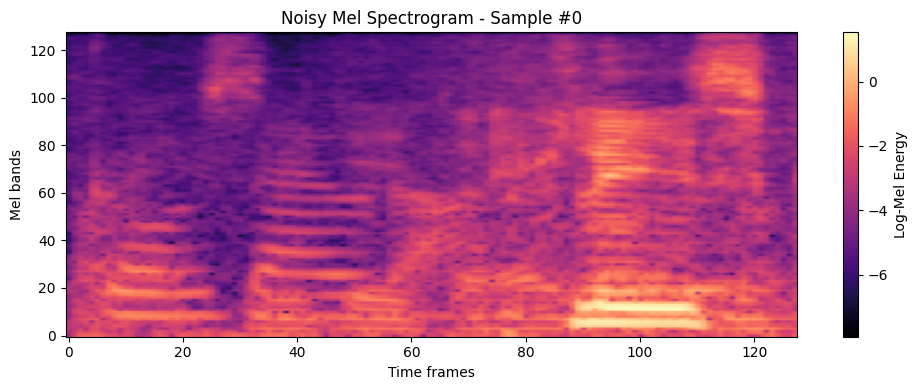

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Example index to plot
idx = 0

# Select one spectrogram from the batch and remove the channel dimension
spectrogram = noisy_tensor[idx, :, :, 0].numpy()  # shape: (freq_bins, segment_length)

# Plot using matplotlib
plt.figure(figsize=(10, 4))
plt.imshow(spectrogram, aspect='auto', origin='lower', cmap='magma')
plt.colorbar(label='Log-Mel Energy')
plt.title(f"Noisy Mel Spectrogram - Sample #{idx}")
plt.xlabel("Time frames")
plt.ylabel("Mel bands")
plt.tight_layout()
plt.show()


In [6]:
# Reconstruct the tensors (noisy_tensor, clean_tensor) from your Dataset if needed:
noisy_list = []
clean_list = []

for noisy, clean in dataset:
    noisy_list.append(noisy.numpy())
    clean_list.append(clean.numpy())

noisy_array = np.concatenate(noisy_list, axis=0)
clean_array = np.concatenate(clean_list, axis=0)

In [ ]:
# Save to .npz file for usage in Google Colab or other training environments

np.savez("denoising_dataset.npz", noisy=noisy_array, clean=clean_array)

In [121]:
noisy_test_path = "C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/noisy_testset_wav"
clean_test_path = "C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/clean_testset_wav"
denoised_test_path = "C:/Users/droch/Documents/LCC/SeminarioIA/speech/denoised"

In [ ]:
# Specific test pairs to evaluate model performance

test_pairs = ["p232_241.wav", # Male pairs
              "p232_242.wav",
              "p232_244.wav",
              "p232_409.wav",
              "p232_388.wav",
              "p232_386.wav",
              "p257_422.wav", # Female pairs
              "p257_331.wav",
              "p257_311.wav",
              "p257_211.wav",
              "p257_087.wav",
              "p257_013.wav"]

In [ ]:
import random
import os

# Ensure matching filenames
file_names_test = sorted([f for f in os.listdir(noisy_test_path) if f.endswith('.wav')])

# Create full file paths
paired_files_test = [(os.path.join(noisy_test_path, f), os.path.join(clean_test_path, f), os.path.join(denoised_test_path)) for f in file_names_test]

In [128]:
def display_named_pairs_spectrograms(paired_files, target_names):
    """
    Displays spectrograms of specified noisy-clean pairs.
    
    Parameters:
        paired_files (list of tuples): [(noisy_path, clean_path), ...]
        target_names (list of str): list of filenames (e.g., ["p232_001.wav", ...])
    """
    for noisy_path, clean_path, denoised_path in paired_files:
        filename = os.path.basename(noisy_path)
        if filename in target_names:
            audio_n, _ = sf.read(noisy_path)
            audio_c, _ = sf.read(clean_path)
            audio_d, _ = sf.read(denoised_path)

            stft_n = librosa.stft(audio_n, n_fft=512, hop_length=128, window=np.hanning(512))
            stft_c = librosa.stft(audio_c, n_fft=512, hop_length=128, window=np.hanning(512))
            stft_d = librosa.stft(audio_d, n_fft=512, hop_length=128, window=np.hanning(512))

            db_n = librosa.amplitude_to_db(np.abs(stft_n), ref=np.max)
            db_c = librosa.amplitude_to_db(np.abs(stft_c), ref=np.max)
            db_d = librosa.amplitude_to_db(np.abs(stft_d), ref=np.max)

            plt.figure(figsize=(18, 5))

            plt.subplot(1, 3, 1)
            librosa.display.specshow(db_n, sr=16000, hop_length=128, x_axis='time', y_axis='linear')
            plt.title(f"Noisy: {filename}")
            plt.colorbar(format="%+2.0f dB")

            plt.subplot(1, 3, 2)
            librosa.display.specshow(db_c, sr=16000, hop_length=128, x_axis='time', y_axis='linear')
            plt.title(f"Clean: {filename}")
            plt.colorbar(format="%+2.0f dB")

            plt.subplot(1, 3, 3)
            librosa.display.specshow(db_d, sr=16000, hop_length=128, x_axis='time', y_axis='linear')
            plt.title(f"Denoised: {filename}")
            plt.colorbar(format="%+2.0f dB")

            plt.tight_layout()
            plt.show()


In [ ]:
def get_target_file_pairs(noisy_dir, clean_dir, denoised_dir, target_filenames):
    """
    Given noisy and clean directories, return full file paths for matching .wav files in target_filenames.

    Parameters:
        noisy_dir (str): Path to the directory with noisy .wav files.
        clean_dir (str): Path to the directory with clean .wav files.
        target_filenames (list of str): Filenames to search for, e.g., ["p232_001.wav", "p257_014.wav"]

    Returns:
        List of (noisy_path, clean_path) tuples.
    """
    paired_paths = []
    for filename in target_filenames:
        noisy_path = os.path.join(noisy_dir, filename)
        clean_path = os.path.join(clean_dir, filename)
        denoised_path = os.path.join(denoised_dir, filename)


        if os.path.exists(noisy_path) and os.path.exists(clean_path) and os.path.exists(denoised_path):
            paired_paths.append((noisy_path, clean_path, denoised_path))
        else:
            print(f"Missing file: {filename}")

    return paired_paths

In [124]:
paired_files_test = get_target_file_pairs(noisy_test_path, clean_test_path, denoised_test_path, test_pairs)

In [125]:
paired_files_test

[('C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/noisy_testset_wav\\p232_241.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/clean_testset_wav\\p232_241.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/speech/denoised\\p232_241.wav'),
 ('C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/noisy_testset_wav\\p232_242.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/clean_testset_wav\\p232_242.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/speech/denoised\\p232_242.wav'),
 ('C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/noisy_testset_wav\\p232_244.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/clean_testset_wav\\p232_244.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/speech/denoised\\p232_244.wav'),
 ('C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/noisy_testset_wav\\p232_409.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/Valentini/clean_testset_wav\\p232_409.wav',
  'C:/Users/droch/Documents/LCC/SeminarioIA/speech/denoised\\p232

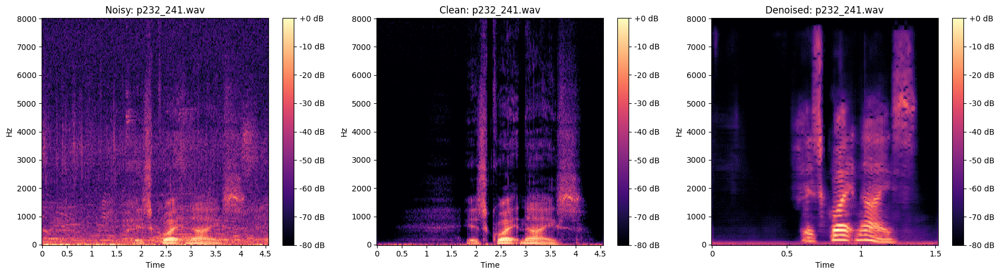

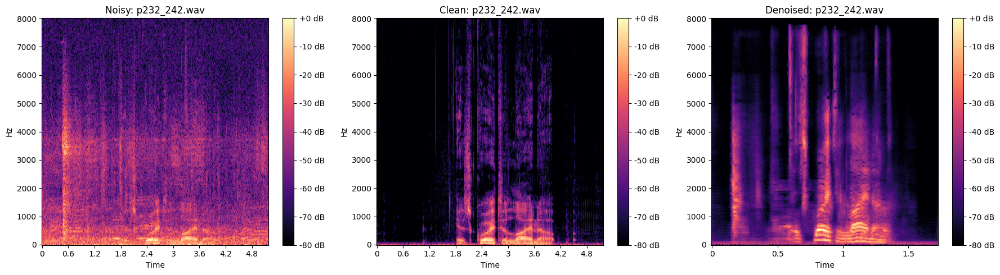

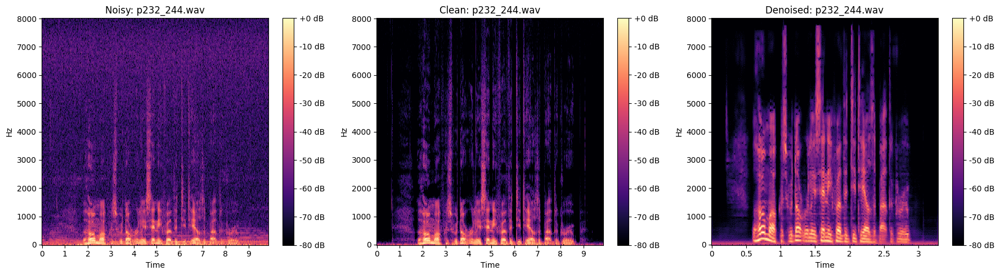

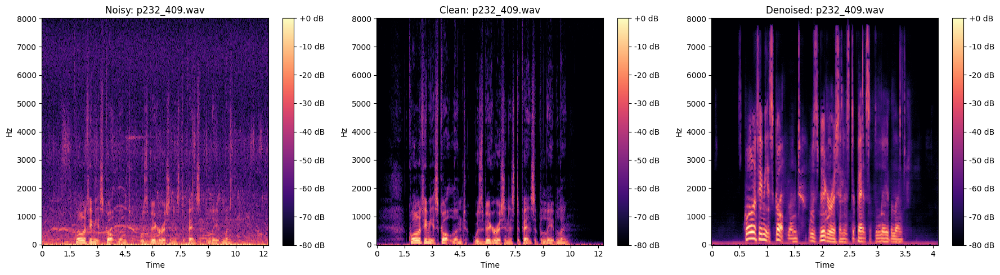

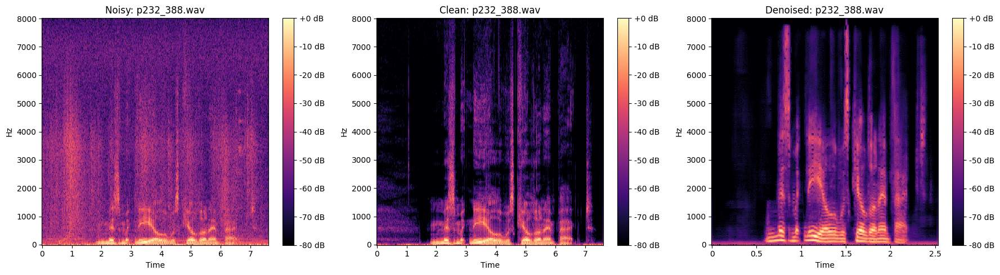

...

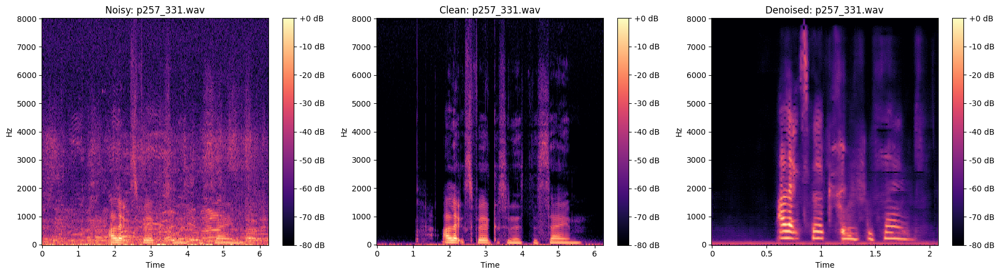

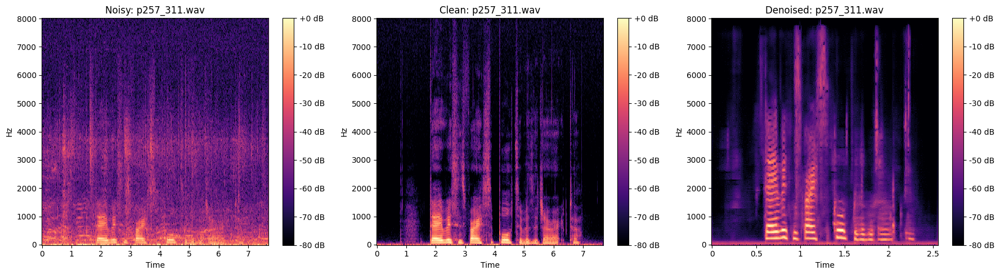

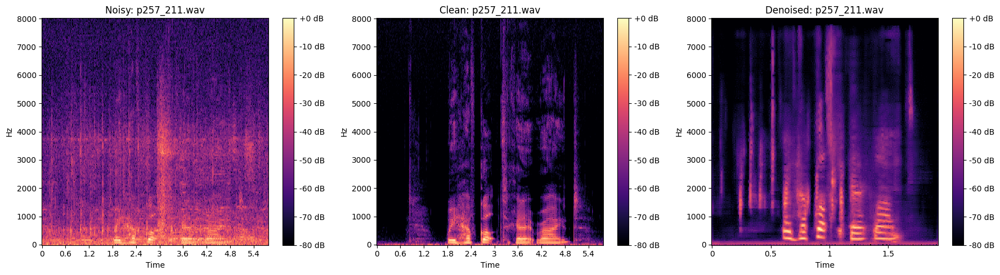

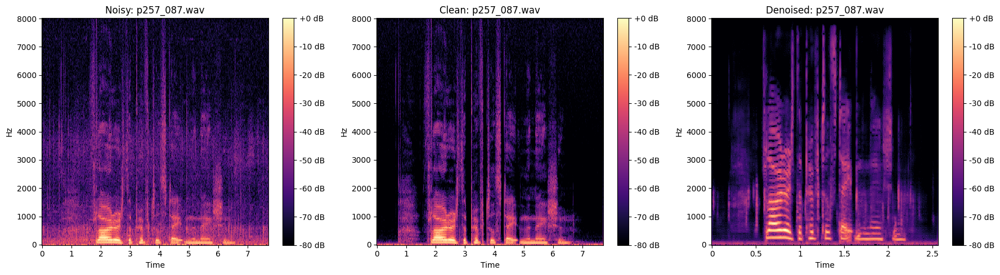

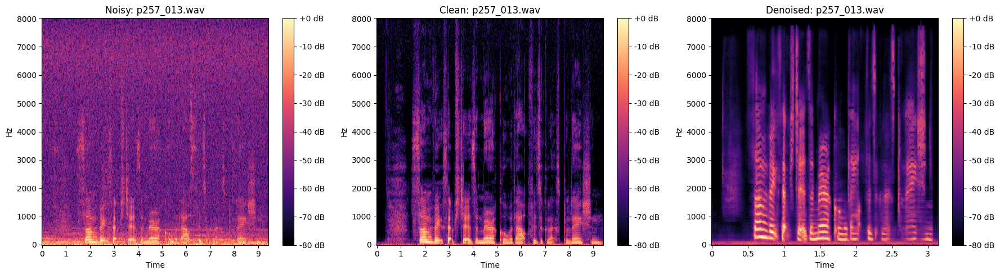

In [ ]:
# Display the selected test pairs spectrograms after denoising with the model

display_named_pairs_spectrograms(paired_files_test, test_pairs)

In [69]:
# Example to process all pairs and get segmented inputs
all_noisy_test_segments = []
all_clean_test_segments = []

segment_counts = []
original_frame_lengths = []

for noisy_file, clean_file in paired_files_test:
    noisy_spec = load_and_preprocess(noisy_file)
    clean_spec = load_and_preprocess(clean_file)
    
    # Store original frame lengths
    original_frame_lengths.append(noisy_spec.shape[1])

    noisy_segs = segment_spectrogram(noisy_spec, segment_length)
    clean_segs = segment_spectrogram(clean_spec, segment_length)
    
    # Store segment counts
    segment_counts.append(len(noisy_segs))

    all_noisy_test_segments.extend(noisy_segs)
    all_clean_test_segments.extend(clean_segs)

# Convert lists to numpy arrays (N, freq_bins, segment_length)
all_noisy_test_segments = np.array(all_noisy_test_segments)
all_clean_test_segments = np.array(all_clean_test_segments)

# Add channel dimension for U-Net: (N, 1, freq_bins, segment_length)
all_noisy_test_segments = all_noisy_test_segments[:, np.newaxis, :, :]
all_clean_test_segments = all_clean_test_segments[:, np.newaxis, :, :]

print(f"Noisy segments shape: {all_noisy_test_segments.shape}")
print(f"Clean segments shape: {all_clean_test_segments.shape}")

print("Original frame lengths:", original_frame_lengths)
print("Segment counts per file:", segment_counts)

Noisy segments shape: (36, 1, 128, 128)
Clean segments shape: (36, 1, 128, 128)
Original frame lengths: [190, 216, 411, 512, 317, 281, 384, 260, 320, 241, 321, 393]
Segment counts per file: [2, 2, 4, 4, 3, 3, 3, 3, 3, 2, 3, 4]


In [70]:
noisy_test_tensor = tf.convert_to_tensor(all_noisy_test_segments, dtype=tf.float32)
clean_test_tensor = tf.convert_to_tensor(all_clean_test_segments, dtype=tf.float32)

noisy_test_tensor, clean_test_tensor = preprocess_for_keras(noisy_test_tensor, clean_test_tensor)

test_dataset = tf.data.Dataset.from_tensor_slices((noisy_test_tensor, clean_test_tensor))

# Shuffle and batch
batch_size = 16
test_dataset = test_dataset.shuffle(buffer_size=1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)

# Example of iterating batches
for noisy_batch, clean_batch in test_dataset.take(1):
    print(noisy_batch.shape)  # (batch_size, freq_bins, segment_length, 1)
    print(clean_batch.shape)

(16, 128, 128, 1)
(16, 128, 128, 1)


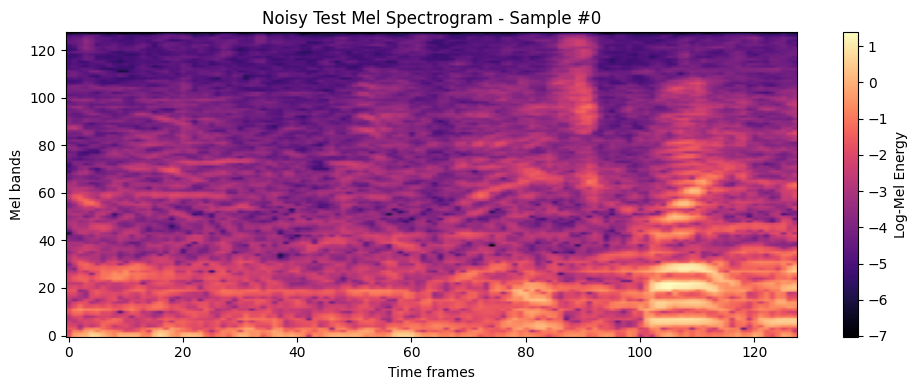

In [71]:
import matplotlib.pyplot as plt


# Example index to plot
idx = 0

# Select one spectrogram from the batch and remove the channel dimension
noisy_spectrogram = noisy_test_tensor[idx, :, :, 0].numpy()  # shape: (freq_bins, segment_length)

# Plot using matplotlib
plt.figure(figsize=(10, 4))
plt.imshow(noisy_spectrogram, aspect='auto', origin='lower', cmap='magma')
plt.colorbar(label='Log-Mel Energy')
plt.title(f"Noisy Test Mel Spectrogram - Sample #{idx}")
plt.xlabel("Time frames")
plt.ylabel("Mel bands")
plt.tight_layout()
plt.show()


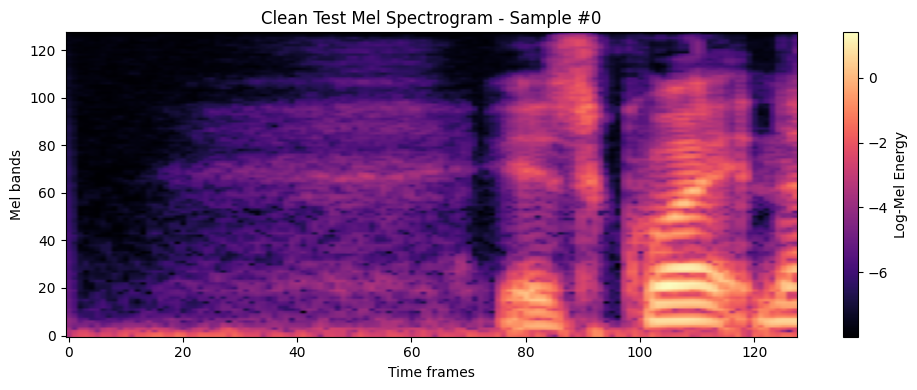

In [72]:
# Example index to plot
idx = 0

# Select one spectrogram from the batch and remove the channel dimension
clean_spectrogram = clean_test_tensor[idx, :, :, 0].numpy()  # shape: (freq_bins, segment_length)

# Plot using matplotlib
plt.figure(figsize=(10, 4))
plt.imshow(clean_spectrogram, aspect='auto', origin='lower', cmap='magma')
plt.colorbar(label='Log-Mel Energy')
plt.title(f"Clean Test Mel Spectrogram - Sample #{idx}")
plt.xlabel("Time frames")
plt.ylabel("Mel bands")
plt.tight_layout()
plt.show()

In [75]:
test_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 128, 128, 1), dtype=tf.float32, name=None))>

In [73]:
model = tf.keras.models.load_model("C:/Users/droch/Documents/LCC/SeminarioIA/speech/denoising_model.keras")

c:\Users\droch\Documents\LCC\SeminarioIA\denoising\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 38 variables whereas the saved optimizer has 74 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [74]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        160 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ max_pooling2d_2[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose    │ (None, 32, 32,    │     73,792 │ conv2d_7[0][0]    │
│ (Conv2DTranspose)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 32, 32,    │          0 │ conv2d_transpose… │
│ (Concatenate)       │ 128)              │            │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_8 (Conv2D)   │ (None, 32, 32,    │     73,792 │ concatenate[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_9 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_8[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_1  │ (None, 64, 64,    │     18,464 │ conv2d_9[0][0]  

 Total params: 1,071,012 (4.09 MB)

 Trainable params: 535,505 (2.04 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 535,507 (2.04 MB)

In [75]:
noisy_test_tensor.shape

TensorShape([36, 128, 128, 1])

In [76]:
denoised_segments = model.predict(noisy_test_tensor)
print(f"Denoised segments shape: {denoised_segments.shape}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 412ms/step
Denoised segments shape: (36, 128, 128, 1)


In [77]:
denoised_segments.shape

(36, 128, 128, 1)

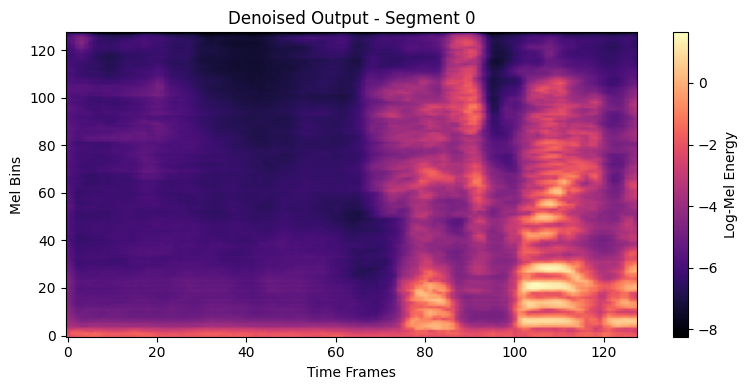

In [79]:
import matplotlib.pyplot as plt
import numpy as np

# Select the first segment and remove the channel dimension
spectrogram = denoised_segments[0, :, :, 0]  # shape: (128, 128)

# Plot using imshow
plt.figure(figsize=(8, 4))
plt.imshow(spectrogram, origin='lower', aspect='auto', cmap='magma')
plt.colorbar(label="Log-Mel Energy")
plt.title("Denoised Output - Segment 0")
plt.xlabel("Time Frames")
plt.ylabel("Mel Bins")
plt.tight_layout()
plt.show()

In [80]:
# Remove channel dimension and concatenate along time axis
denoised_spectrogram = np.concatenate(
    [seg[:, :, 0] for seg in denoised_segments], axis=1  # (128, 128) -> concat along time
)

In [ ]:
noisy_test_spectrogram = np.concatenate(
    [seg[:, :, 0] for seg in noisy_test_tensor], axis=1
)

In [ ]:
clean_test_spectrogram = np.concatenate(
    [seg[:, :, 0] for seg in clean_test_tensor], axis=1
)

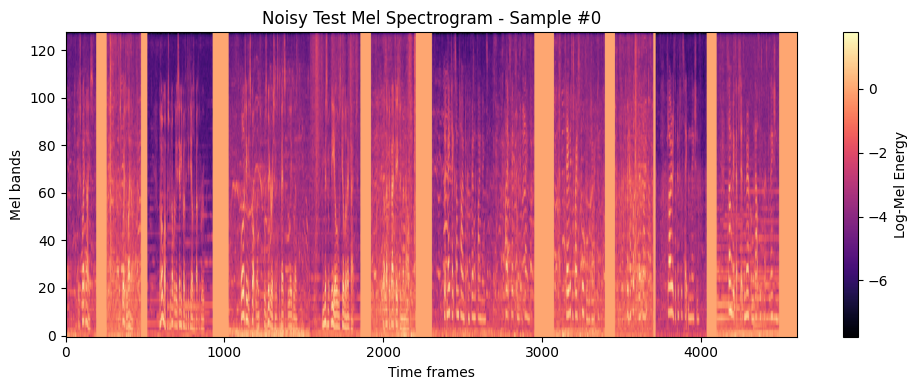

In [82]:
# Example index to plot
idx = 0

# Plot using matplotlib
plt.figure(figsize=(10, 4))
plt.imshow(noisy_test_spectrogram, aspect='auto', origin='lower', cmap='magma')
plt.colorbar(label='Log-Mel Energy')
plt.title(f"Noisy Test Mel Spectrogram - Sample #{idx}")
plt.xlabel("Time frames")
plt.ylabel("Mel bands")
plt.tight_layout()
plt.show()

In [83]:
denoised_spectrogram.shape

(128, 4608)

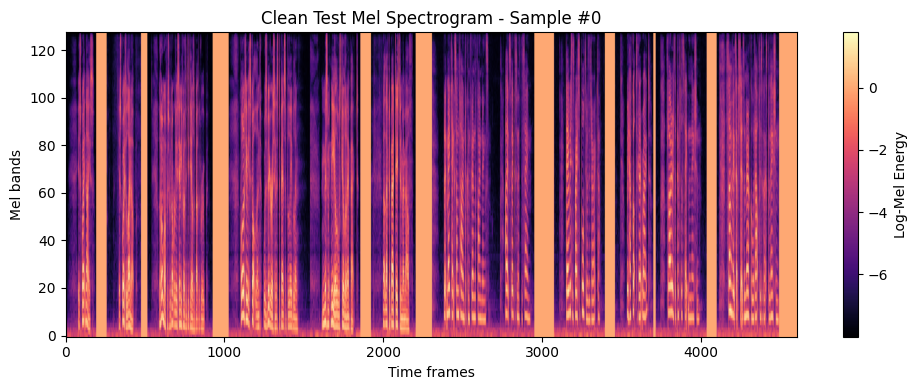

In [115]:
# Example index to plot
idx = 0

# Plot using matplotlib
plt.figure(figsize=(10, 4))
plt.imshow(clean_test_spectrogram, aspect='auto', origin='lower', cmap='magma')
plt.colorbar(label='Log-Mel Energy')
plt.title(f"Clean Test Mel Spectrogram - Sample #{idx}")
plt.xlabel("Time frames")
plt.ylabel("Mel bands")
plt.tight_layout()
plt.show()

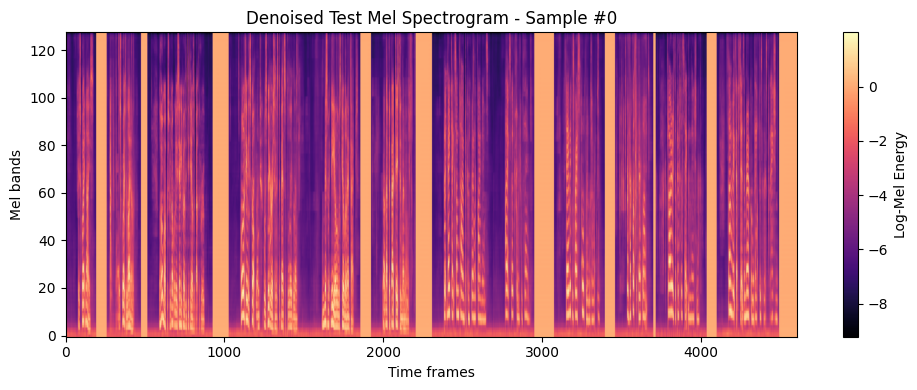

In [116]:
# Example index to plot
idx = 0

# Plot using matplotlib
plt.figure(figsize=(10, 4))
plt.imshow(denoised_spectrogram, aspect='auto', origin='lower', cmap='magma')
plt.colorbar(label='Log-Mel Energy')
plt.title(f"Denoised Test Mel Spectrogram - Sample #{idx}")
plt.xlabel("Time frames")
plt.ylabel("Mel bands")
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt

def plot_test_mel_spectrograms(noisy_test_spectrogram, clean_test_spectrogram, denoised_ind_specs, original_frame_lengths, test_pairs):
    """
    Plots complete Mel spectrograms for each test file (noisy, denoised, clean).
    """
    for i in range(len(test_pairs)):
        orig_len = original_frame_lengths[i]

        noisy_mel = noisy_test_spectrogram[:, :orig_len]
        clean_mel = clean_test_spectrogram[:, :orig_len]
        denoised_mel = denoised_ind_specs[i]

        plt.figure(figsize=(18, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(noisy_mel, aspect='auto', origin='lower', cmap='magma')
        plt.title(f"Noisy\n{os.path.basename(test_pairs[i][0])}")
        plt.xlabel("Time frames")
        plt.ylabel("Mel bins")
        plt.colorbar(label="Log-Mel Energy")

        plt.subplot(1, 3, 2)
        plt.imshow(denoised_mel, aspect='auto', origin='lower', cmap='magma')
        plt.title("Denoised")
        plt.xlabel("Time frames")
        plt.ylabel("Mel bins")
        plt.colorbar(label="Log-Mel Energy")

        plt.subplot(1, 3, 3)
        plt.imshow(clean_mel, aspect='auto', origin='lower', cmap='magma')
        plt.title("Clean")
        plt.xlabel("Time frames")
        plt.ylabel("Mel bins")
        plt.colorbar(label="Log-Mel Energy")

        plt.tight_layout()
        plt.show()


In [85]:
denoised_spectrogram

array([[-2.1496997e+00, -1.9906833e+00, -1.7622130e+00, ...,
         9.1667622e-02, -1.1808750e-01, -1.9871983e-01],
       [-2.3046496e+00, -1.5855935e+00, -1.6749033e+00, ...,
         2.5500029e-02, -6.2387377e-02, -6.9674343e-02],
       [-2.5105951e+00, -1.9924033e+00, -2.0184126e+00, ...,
         1.1305866e-01,  1.3147530e-01,  7.2091699e-02],
       ...,
       [-5.6122508e+00, -5.3836622e+00, -4.9594617e+00, ...,
        -1.5226245e-02, -2.7046889e-02,  2.3511946e-03],
       [-6.1195302e+00, -5.5328207e+00, -5.2454391e+00, ...,
        -7.1531981e-03,  1.6187459e-02, -5.4731876e-02],
       [-6.7315688e+00, -6.7090039e+00, -6.5209846e+00, ...,
        -1.6264856e-02, -4.0832728e-02, -4.9821615e-02]], dtype=float32)

In [86]:
denoised_ind_specs = []  # final list: one full spectrogram per file

start_idx = 0

for seg_count, orig_length in zip(segment_counts, original_frame_lengths):
    # Extract this file's predicted segments
    file_segments = denoised_segments[start_idx : start_idx + seg_count]
    start_idx += seg_count

    # Remove channel dimension and stitch along time axis
    stitched = np.concatenate([seg[:, :, 0] for seg in file_segments], axis=1)  # (128, total_frames)

    # Trim to original number of time frames
    stitched = stitched[:, :orig_length]  # Remove padding

    # Save final full spectrogram
    denoised_ind_specs.append(stitched)  # Each: (128, orig_length)

In [117]:
noisy_test_specs_stitched = []  # final list: one full spectrogram per file

start_idx = 0

for seg_count, orig_length in zip(segment_counts, original_frame_lengths):
    # Extract this file's predicted segments
    file_segments = all_noisy_test_segments[start_idx : start_idx + seg_count]
    start_idx += seg_count

    # Remove channel dimension and stitch along time axis
    stitched = np.concatenate([seg[:, :, 0] for seg in file_segments], axis=1)  # (128, total_frames)

    # Trim to original number of time frames
    stitched = stitched[:, :orig_length]  # Remove padding

    # Save final full spectrogram
    noisy_test_specs_stitched.append(stitched)  # Each: (128, orig_length)

In [118]:
clean_test_specs_stitched = []  # final list: one full spectrogram per file

start_idx = 0

for seg_count, orig_length in zip(segment_counts, original_frame_lengths):
    # Extract this file's predicted segments
    file_segments = all_clean_test_segments[start_idx : start_idx + seg_count]
    start_idx += seg_count

    # Remove channel dimension and stitch along time axis
    stitched = np.concatenate([seg[:, :, 0] for seg in file_segments], axis=1)  # (128, total_frames)

    # Trim to original number of time frames
    stitched = stitched[:, :orig_length]  # Remove padding

    # Save final full spectrogram
    clean_test_specs_stitched.append(stitched)  # Each: (128, orig_length)

In [110]:
test_pairs

['p232_241.wav',
 'p232_242.wav',
 'p232_244.wav',
 'p232_409.wav',
 'p232_388.wav',
 'p232_386.wav',
 'p257_422.wav',
 'p257_331.wav',
 'p257_311.wav',
 'p257_211.wav',
 'p257_087.wav',
 'p257_013.wav']

In [94]:
target_names

['p232_241.wav',
 'p232_242.wav',
 'p232_244.wav',
 'p232_409.wav',
 'p232_388.wav',
 'p232_386.wav',
 'p257_422.wav',
 'p257_331.wav',
 'p257_311.wav',
 'p257_211.wav',
 'p257_087.wav',
 'p257_013.wav']

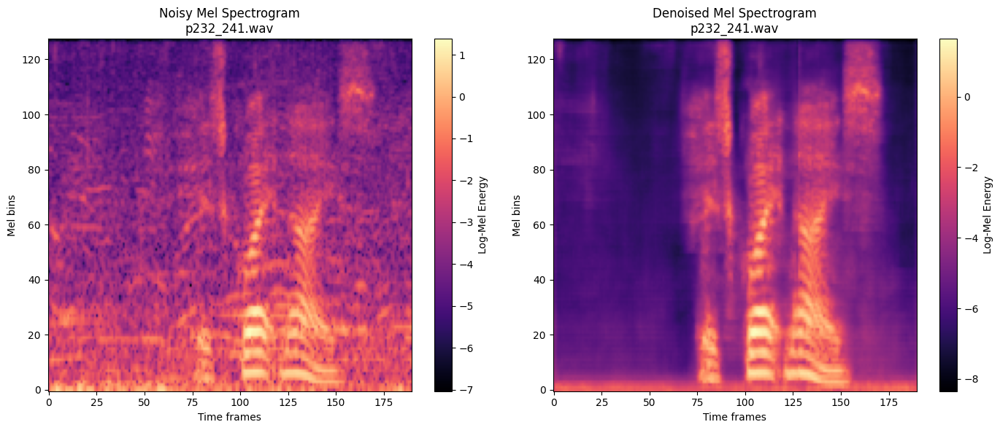

In [ ]:
# Choose the file index to display (e.g., 0 for the first test file)
file_idx = 0

# Get the original frame length for this file
orig_len = original_frame_lengths[file_idx]

# Noisy: extract the correct slice from the full test spectrogram
noisy_mel = noisy_test_spectrogram[:, :orig_len]

# Denoised: get the stitched mel spectrogram for this file
denoised_mel = denoised_ind_specs[file_idx]



plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(noisy_mel, aspect='auto', origin='lower', cmap='magma')
plt.title(f"Noisy Mel Spectrogram\n{test_pairs[file_idx]}")
plt.xlabel("Time frames")
plt.ylabel("Mel bins")
plt.colorbar(label="Log-Mel Energy")

plt.subplot(1, 2, 2)
plt.imshow(denoised_mel, aspect='auto', origin='lower', cmap='magma')
plt.title(f"Denoised Mel Spectrogram\n{test_pairs[file_idx]}")
plt.xlabel("Time frames")
plt.ylabel("Mel bins")
plt.colorbar(label="Log-Mel Energy")

plt.tight_layout()
plt.show()

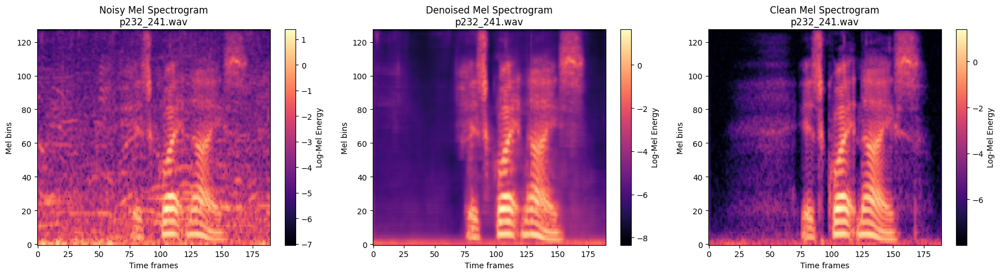

In [ ]:
import matplotlib.pyplot as plt

# Choose the file index to display (e.g., 0 for the first test file)
file_idx = 0

# Get the original frame length for this file
orig_len = original_frame_lengths[file_idx]

# Denoised: get the stitched mel spectrogram for this file
noisy_mel = denoised_ind_specs[file_idx]

# Denoised: get the stitched mel spectrogram for this file
denoised_mel = denoised_ind_specs[file_idx]

# Denoised: get the stitched mel spectrogram for this file
denoised_mel = denoised_ind_specs[file_idx]



plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(noisy_mel, aspect='auto', origin='lower', cmap='magma')
plt.title(f"Noisy Mel Spectrogram\n{test_pairs[file_idx]}")
plt.xlabel("Time frames")
plt.ylabel("Mel bins")
plt.colorbar(label="Log-Mel Energy")

plt.subplot(1, 3, 2)
plt.imshow(denoised_mel, aspect='auto', origin='lower', cmap='magma')
plt.title(f"Denoised Mel Spectrogram\n{test_pairs[file_idx]}")
plt.xlabel("Time frames")
plt.ylabel("Mel bins")
plt.colorbar(label="Log-Mel Energy")

plt.subplot(1, 3, 3)
plt.imshow(clean_mel, aspect='auto', origin='lower', cmap='magma')
plt.title(f"Clean Mel Spectrogram\n{test_pairs[file_idx]}")
plt.xlabel("Time frames")
plt.ylabel("Mel bins")
plt.colorbar(label="Log-Mel Energy")

plt.tight_layout()
plt.show()

In [87]:
for i, seg in enumerate(denoised_ind_specs):
    print(f"Segment {i} shape: {seg.shape}")

Segment 0 shape: (128, 190)
Segment 1 shape: (128, 216)
Segment 2 shape: (128, 411)
Segment 3 shape: (128, 512)
Segment 4 shape: (128, 317)
Segment 5 shape: (128, 281)
Segment 6 shape: (128, 384)
Segment 7 shape: (128, 260)
Segment 8 shape: (128, 320)
Segment 9 shape: (128, 241)
Segment 10 shape: (128, 321)
Segment 11 shape: (128, 393)


In [89]:
def reconstruct_waveform_from_log_mel(log_mel_spec, sample_rate=16000, n_fft=512, hop_length=128, n_mels=128):
    # Step 1: Invert log
    mel_spec = 10 ** log_mel_spec - 1e-8

    # Step 2: Invert Mel → linear magnitude spectrogram
    mel_basis = librosa.filters.mel(sr=sample_rate, n_fft=n_fft, n_mels=n_mels)
    inv_mel = librosa.feature.inverse.mel_to_stft(mel_spec, sr=sample_rate, n_fft=n_fft, power=2.0)

    # Step 3: Invert STFT using Griffin-Lim (estimates phase)
    audio = librosa.griffinlim(inv_mel, n_iter=32, hop_length=hop_length, win_length=n_fft, window='hann')

    return audio

In [96]:
from IPython.display import Audio

# Reconstruct audio from each spectrogram
for i, log_mel_spec in enumerate(denoised_ind_specs):
    audio = reconstruct_waveform_from_log_mel(log_mel_spec)
    
    # Play it (Colab or Jupyter)
    display(Audio(audio, rate=sample_rate))
    
    # Optional: save to file
    sf.write(f"denoised_{i+1}.wav", audio, sample_rate)

KeyboardInterrupt: 